# About

- In this notebook we will train Yolo v5 and v5 models to detect PPE (Personal Protective Equipment), using [this existing dataset](https://universe.roboflow.com/skcet-g4h72/construction-ppe-rdhzo) from [Roboflow](https://universe.roboflow.com/)

- This notebook is a generic training pipeline that we used to train our Yolo model for object detection task on our **ppe dataset** dataset (images/number of classes), as long as we provide the dataset in the correct folder structure accepted by Yolo and the annotations/labels in Yolo format
- [Ultralytics - docs](https://docs.ultralytics.com/)
- [Ultralytics - github](https://github.com/ultralytics/ultralytics)

___

[Construction PPE Dataset](https://universe.roboflow.com/skcet-g4h72/construction-ppe-rdhzo):

- Labels in this dataset:
    - 0: Gloves
    - 1: Helmet
    -2:   Human
    -3: Safety Boot
    -4: Safety Vest
    -5: boots
    -6: glasses
    -7: gloves
    -8: hat
    -9: helmet
    -10: no boot
    -11: no boots
    -12: no gloves
    -13: no hat
    -14: no vest
    -15: vest


- More info:
    - Number of classes: 16
    - Label Annotation: YOLO format (.txt)
      - `[class_id, center_x, center_y, width, height]`
      
___      

Yolo Dataset folder structure: the paths to these folders will be written to a YAML file that will be used by Yolo.

```
Custom dataset directory (Construction-PPE-3)
    - train
        - images (folder including all training images)
        - labels (folder including all training labels)
    - validation
        - images (folder including all validation images)
        - labels (folder including all validation labels)
    - test
        - images (folder including all test images)
        - labels (folder including all test labels)

```

**<font color='orange'>Let's Start !</font>**

In [ ]:
! nvidia-smi -L

/bin/bash: line 1: nvidia-smi: command not found


# Installs/Imports

In [ ]:
pip install ultralytics

In [31]:
import torch
import ultralytics
print(f"PyTorch version: {torch.__version__}")
print(f"Ultralytics version: {ultralytics.__version__}")

PyTorch version: 2.0.1+cu117
Ultralytics version: 8.2.18


In [2]:
import warnings
warnings.filterwarnings("ignore")

import os
import re
import glob
import random
import yaml

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns

import IPython.display as display
from PIL import Image
import cv2

from ultralytics import YOLO

In [ ]:
! wandb disabled

/bin/bash: line 1: wandb: command not found


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
%cd '/content/drive/MyDrive/Construction-PPE-3'

/content/drive/MyDrive/Construction-PPE-3


# CFG

- CFG class enables easy and organized experimentation
- Set `DEBUG = True` to make quick experiments

In [ ]:
class CFG:
    DEBUG = False
    FRACTION = 0.05 if DEBUG else 1.0
    SEED = 88

    # classes
    CLASSES = ['Gloves',
              'Helmet',
              'Human',
              'Safety Boot',
              'Safety Vest',
              'boots',
              'glasses',
              'gloves',
              'hat',
              'helmet',
              'no boot',
              'no boots',
              'no gloves',
              'no hat',
              'no vest',
              'vest']
    NUM_CLASSES_TO_TRAIN = len(CLASSES)

    # training
    EPOCHS = 3 if DEBUG else 70 # 100
    BATCH_SIZE = 16

    BASE_MODEL = 'yolov5s' # yolov8n, yolov8s, yolov8m, yolov8l, yolov8x, yolov9c, yolov9e
    BASE_MODEL_WEIGHTS = f'{BASE_MODEL}.pt'
    EXP_NAME = f'ppe_css_{EPOCHS}_epochs'

    OPTIMIZER = 'auto' # SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto
    LR = 1e-3
    LR_FACTOR = 0.01
    WEIGHT_DECAY = 5e-4
    DROPOUT = 0.0
    PATIENCE = 20
    PROFILE = False
    LABEL_SMOOTHING = 0.0

    # paths
    CUSTOM_DATASET_DIR = './'
    OUTPUT_DIR = './'

# Create YAML file

- Create ```data.yaml``` file properly formatted to be used by Yolo

In [ ]:
dict_file = {
    'train': os.path.join(CFG.CUSTOM_DATASET_DIR, 'train'),
    'val': os.path.join(CFG.CUSTOM_DATASET_DIR, 'valid'),
    'test': os.path.join(CFG.CUSTOM_DATASET_DIR, 'test'),
    'nc': CFG.NUM_CLASSES_TO_TRAIN,
    'names': CFG.CLASSES
    }

with open(os.path.join(CFG.OUTPUT_DIR, 'data.yaml'), 'w+') as file:
    yaml.dump(dict_file, file)

In [33]:
### read yaml file created
def read_yaml_file(file_path = CFG.CUSTOM_DATASET_DIR):
    with open(file_path, 'r') as file:
        try:
            data = yaml.safe_load(file)
            return data
        except yaml.YAMLError as e:
            print("Error reading YAML:", e)
            return None

### print it with newlines
def print_yaml_data(data):
    formatted_yaml = yaml.dump(data, default_style=False)
    print(formatted_yaml)

file_path = os.path.join(CFG.OUTPUT_DIR, 'data.yaml')
yaml_data = read_yaml_file(file_path)

if yaml_data:
    print_yaml_data(yaml_data)

names:
- Gloves
- Helmet
- Human
- Safety Boot
- Safety Vest
- boots
- glasses
- gloves
- hat
- helmet
- no boot
- no boots
- no gloves
- no hat
- no vest
- vest
nc: 16
test: ./test
train: ./train
val: ./valid



# Dataset

- Check some images
- Image utils

## Visualize one image

In [ ]:
def display_image(image, print_info = True, hide_axis = False):
    if isinstance(image, str):  # Check if it's a file path
        img = Image.open(image)
        plt.imshow(img)
    elif isinstance(image, np.ndarray):  # Check if it's a NumPy array
        image = image[..., ::-1]  # BGR to RGB
        img = Image.fromarray(image)
        plt.imshow(img)
    else:
        raise ValueError("Unsupported image format")

    if print_info:
        print('Type: ', type(img), '\n')
        print('Shape: ', np.array(img).shape, '\n')

    if hide_axis:
        plt.axis('off')

    plt.show()

Type:  <class 'PIL.JpegImagePlugin.JpegImageFile'> 

Shape:  (640, 640, 3) 



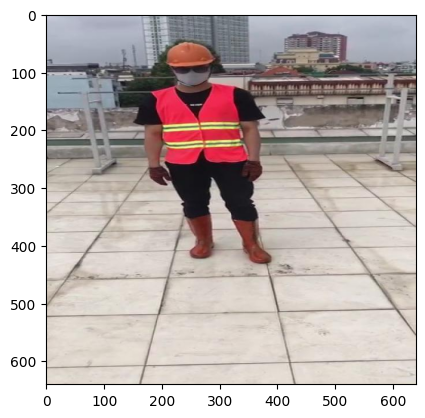

In [34]:
example_image_path = 'train/images/Video4_281_jpg.rf.8417039db44dc7bf13753fbd973231bd.jpg'
display_image(example_image_path, print_info = True, hide_axis = False)

## Visualize many images

In [ ]:
def plot_random_images_from_folder(folder_path, num_images=20, seed=CFG.SEED):

    random.seed(seed)

    # Get a list of image files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg', '.gif'))]

    # Ensure that we have at least num_images files to choose from
    if len(image_files) < num_images:
        raise ValueError("Not enough images in the folder")

    # Randomly select num_images image files
    selected_files = random.sample(image_files, num_images)

    # Create a subplot grid
    num_cols = 5
    num_rows = (num_images + num_cols - 1) // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8))

    for i, file_name in enumerate(selected_files):
        # Open and display the image using PIL
        img = Image.open(os.path.join(folder_path, file_name))

        if num_rows == 1:
            ax = axes[i % num_cols]
        else:
            ax = axes[i // num_cols, i % num_cols]

        ax.imshow(img)
        ax.axis('off')
        # ax.set_title(file_name)

    # Remove empty subplots
    for i in range(num_images, num_rows * num_cols):
        if num_rows == 1:
            fig.delaxes(axes[i % num_cols])
        else:
            fig.delaxes(axes[i // num_cols, i % num_cols])

    plt.tight_layout()
    plt.show()

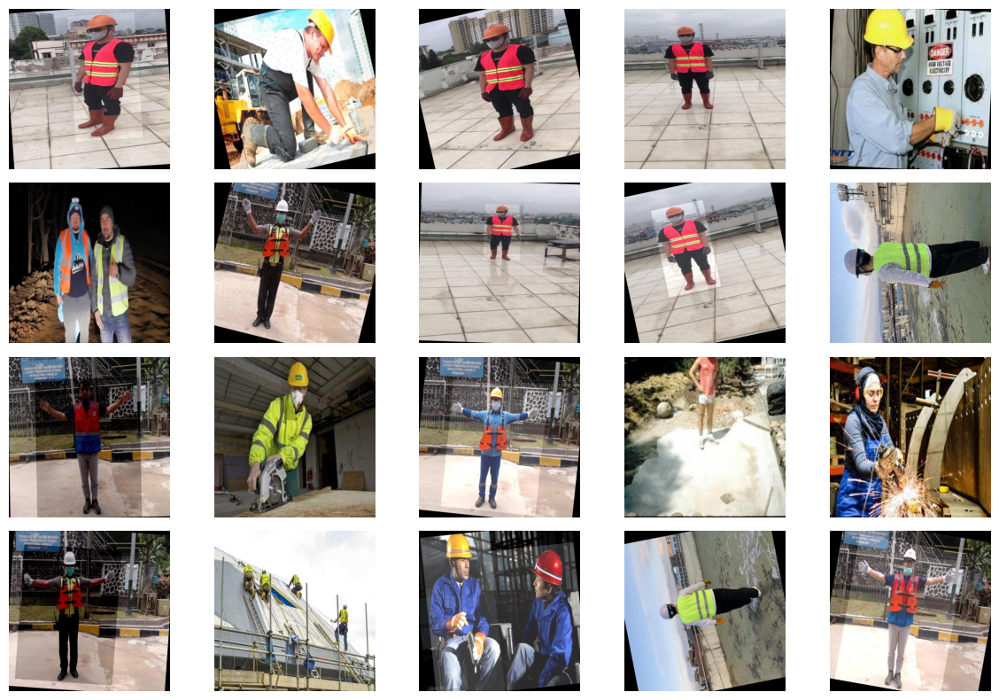

In [ ]:
folder_path = CFG.CUSTOM_DATASET_DIR + '/train/images/'
plot_random_images_from_folder(folder_path, num_images=20, seed=CFG.SEED)
# plot_random_images_from_folder(folder_path, num_images=20, seed=54)

## Image properties

In [ ]:
def get_image_properties(image_path):
    # Read the image file
    img = cv2.imread(image_path)

    # Check if the image file is read successfully
    if img is None:
        raise ValueError("Could not read image file")

    # Get image properties
    properties = {
        "width": img.shape[1],
        "height": img.shape[0],
        "channels": img.shape[2] if len(img.shape) == 3 else 1,
        "dtype": img.dtype,
    }

    return properties

In [ ]:
img_properties = get_image_properties(example_image_path)
img_properties

{'width': 640, 'height': 640, 'channels': 3, 'dtype': dtype('uint8')}

## Dataset statistics

In [ ]:
%%time
class_idx = {str(i): CFG.CLASSES[i] for i in range(CFG.NUM_CLASSES_TO_TRAIN)}

class_stat = {}
data_len = {}
class_info = []

for mode in ['train', 'valid', 'test']:
    class_count = {CFG.CLASSES[i]: 0 for i in range(CFG.NUM_CLASSES_TO_TRAIN)}

    path = os.path.join(CFG.CUSTOM_DATASET_DIR, mode, 'labels')

    for file in os.listdir(path):
        with open(os.path.join(path, file)) as f:
            lines = f.readlines()

            for cls in set([line[0] for line in lines]):
                class_count[class_idx[cls]] += 1

    data_len[mode] = len(os.listdir(path))
    class_stat[mode] = class_count

    class_info.append({'Mode': mode, **class_count, 'Data_Volume': data_len[mode]})

dataset_stats_df = pd.DataFrame(class_info)
dataset_stats_df

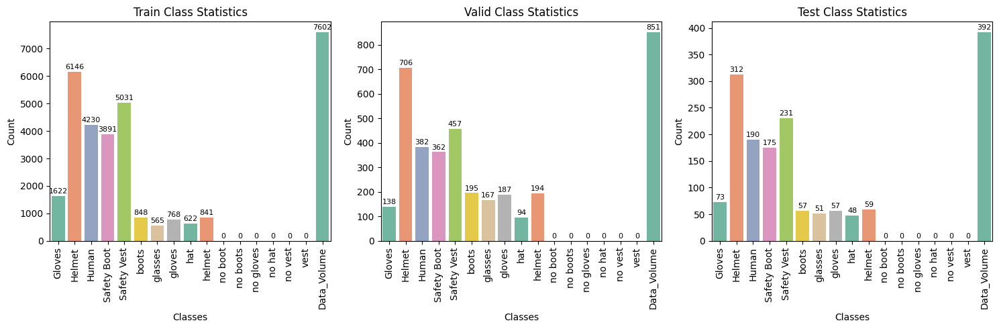

In [ ]:
# Create subplots with 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot vertical bar plots for each mode in subplots
for i, mode in enumerate(['train', 'valid', 'test']):
    sns.barplot(
        data=dataset_stats_df[dataset_stats_df['Mode'] == mode].drop(columns='Mode'),
        orient='v',
        ax=axes[i],
        palette='Set2'
    )

    axes[i].set_title(f'{mode.capitalize()} Class Statistics')
    axes[i].set_xlabel('Classes')
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=90)

    # Add annotations on top of each bar
    for p in axes[i].patches:
        axes[i].annotate(f"{int(p.get_height())}", (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', fontsize=8, color='black', xytext=(0, 5),
                         textcoords='offset points')

plt.tight_layout()
plt.show()

## Image sizes

In [30]:
%%time

for mode in ['train', 'valid', 'test']:
    print(f'\nImage sizes in {mode} set:')

    img_size = 0
    for file in glob.glob(os.path.join(CFG.CUSTOM_DATASET_DIR, mode, 'images', '*')):

        image = Image.open(file)

        if image.size != img_size:
            print(f'{image.size}')
            img_size = image.size
            print('\n')


Image sizes in train set:
(640, 640)



Image sizes in valid set:
(640, 640)



Image sizes in test set:
(640, 640)


CPU times: user 4.39 s, sys: 1.82 s, total: 6.22 s
Wall time: 5min 41s


# Base Model Inference

- Just checking the power of the pretrained model inference on the CSS dataset

In [ ]:
CFG.BASE_MODEL_WEIGHTS

'yolov5s.pt'

In [ ]:
model = YOLO(CFG.BASE_MODEL_WEIGHTS)

results = model.predict(
    source = example_image_path,
    classes = [0],
    conf = 0.30,
    device = '',  # Utilise le CPU pour l'inférence
    imgsz = (img_properties['height'], img_properties['width']),
    save = True,
    save_txt = True,
    save_conf = True,
    exist_ok = True,
    project = 'runs/detect/'
)

PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.


image 1/1 /content/drive/MyDrive/Construction-PPE-3/train/images/Video4_281_jpg.rf.8417039db44dc7bf13753fbd973231bd.jpg: 640x640 1 person, 937.9ms
Speed: 32.3ms preprocess, 937.9ms inference, 167.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict
5395 labels saved to runs/detect/predict/labels


Type:  <class 'PIL.JpegImagePlugin.JpegImageFile'> 

Shape:  (640, 640, 3) 



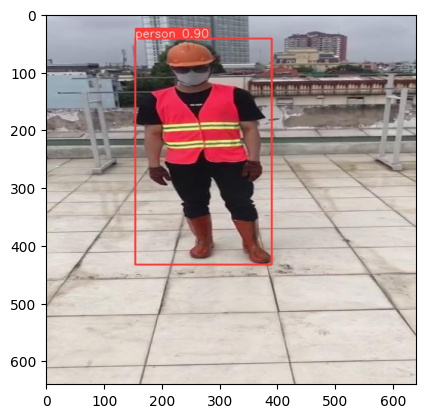

In [ ]:
### check predictions with base model
example_image_inference_output = example_image_path.split('/')[-1]
display_image(f'runs/detect/predict/{example_image_inference_output}')

# Train

[Arguments for training](https://docs.ultralytics.com/modes/train/#arguments)

In [ ]:
print('Model: ', CFG.BASE_MODEL_WEIGHTS)
print('Epochs: ', CFG.EPOCHS)
print('Batch: ', CFG.BATCH_SIZE)

Model:  yolov5s.pt
Epochs:  70
Batch:  16


In [ ]:
### Load pre-trained YOLO model
model = YOLO(CFG.BASE_MODEL_WEIGHTS)

In [ ]:
%%time

### train
model.train(
    data = os.path.join(CFG.OUTPUT_DIR, 'data.yaml'),

    task = 'detect',

    imgsz = (img_properties['height'], img_properties['width']),

    epochs = CFG.EPOCHS,
    batch = CFG.BATCH_SIZE,
    optimizer = CFG.OPTIMIZER,
    lr0 = CFG.LR,
    lrf = CFG.LR_FACTOR,
    weight_decay = CFG.WEIGHT_DECAY,
    dropout = CFG.DROPOUT,
    fraction = CFG.FRACTION,
    patience = CFG.PATIENCE,
    profile = CFG.PROFILE,
    label_smoothing = CFG.LABEL_SMOOTHING,

    name = f'{CFG.BASE_MODEL}_{CFG.EXP_NAME}',
    seed = CFG.SEED,

    val = True,
    amp = True,
    exist_ok = True,
    resume = False,
    device = [0,1], # 0
    verbose = False,
)

# Export

- [Export mode](https://docs.ultralytics.com/modes/export/) is used for exporting a YOLOv9 model to a format that can be used for deployment. In this mode, the model is converted to a format that can be used by other software applications or hardware devices. This mode is useful when deploying the model to production environments.

In [ ]:
img_properties

{'width': 640, 'height': 640, 'channels': 3, 'dtype': dtype('uint8')}

In [ ]:
# Export the model
model.export(
    format = 'onnx', # openvino, onnx, engine, tflite
    imgsz = (img_properties['height'], img_properties['width']),
    half = False,
    int8 = False,
    simplify = False,
    nms = False,
)

# Train results

### **`Best model after training "Best.pt"`**


0: 416x416 1 hat, 2 no vests, 1 vest, 335.2ms
Speed: 19.4ms preprocess, 335.2ms inference, 150.2ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 4 hats, 3 no vests, 1 vest, 248.0ms
Speed: 2.9ms preprocess, 248.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 hat, 1 vest, 244.5ms
Speed: 3.8ms preprocess, 244.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 2 hats, 1 no vest, 1 vest, 516.3ms
Speed: 3.4ms preprocess, 516.3ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 hat, 5 no hats, 3 no vests, 432.3ms
Speed: 5.2ms preprocess, 432.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 hat, 3 no vests, 422.7ms
Speed: 3.2ms preprocess, 422.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 (no detections), 410.9ms
Speed: 3.0ms preprocess, 410.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 416)

0: 416x

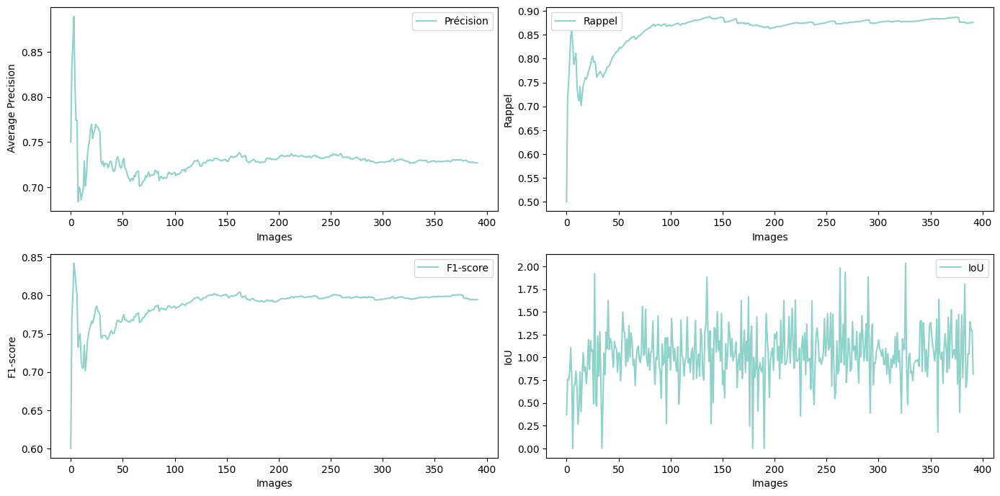

Précision finale : 0.7273105745212323
Rappel final : 0.8756892230576441
F1-score final : 0.794632704116443
IoU moyen : 1.0258843542161793


In [35]:
import os
import cv2
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt

def calculate_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    xi1 = max(x1_min, x2_min)
    yi1 = max(y1_min, y2_min)
    xi2 = min(x1_max, x2_max)
    yi2 = min(y1_max, y2_max)
    inter_area = max(0, xi2 - xi1 + 1) * max(0, yi2 - yi1 + 1)

    box1_area = (x1_max - x1_min + 1) * (y1_max - y1_min + 1)
    box2_area = (x2_max - x2_min + 1) * (y2_max - y2_min + 1)

    union_area = box1_area + box2_area - inter_area
    iou = inter_area / union_area

    return iou

model = YOLO('/content/drive/MyDrive/Construction-PPE-3/runs/detect/yolov5s_ppe_css_18_epochs/weights/best.pt')
images_folder = "test/images/"
labels_folder = "test/labels/"

vrais_positifs = 0
faux_positifs = 0
faux_negatifs = 0

iou_threshold = 0.5
image_files = os.listdir(images_folder)

precisions = []
rappels = []
f1_scores = []
ious = []

for image_file in image_files:
    if image_file.endswith(".jpg"):
        image_path = os.path.join(images_folder, image_file)
        label_file = os.path.splitext(image_file)[0] + ".txt"
        label_path = os.path.join(labels_folder, label_file)

        image = cv2.imread(image_path)
        results = model(image)
        predictions = results[0].boxes.xyxy.cpu().numpy()

        with open(label_path, "r") as f:
            annotations = f.readlines()

        true_boxes = []
        for annotation in annotations:
            parts = annotation.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])
            img_height, img_width, _ = image.shape
            x_center *= img_width
            y_center *= img_height
            width *= img_width
            height *= img_height
            x_min = int(x_center - width / 2)
            y_min = int(y_center - height / 2)
            x_max = int(x_center + width / 2)
            y_max = int(y_center + height / 2)
            true_boxes.append([x_min, y_min, x_max, y_max, class_id])

        matched_predictions = set()
        for true_box in true_boxes:
            best_iou = 0
            best_pred_idx = -1
            for pred_idx, prediction in enumerate(predictions):
                pred_box = prediction[:4]
                iou = calculate_iou(true_box[:4], pred_box)
                if iou > best_iou:
                    best_iou = iou
                    best_pred_idx = pred_idx
            if best_iou >= iou_threshold:
                vrais_positifs += 1
                matched_predictions.add(best_pred_idx)
            else:
                faux_negatifs += 1

        for pred_idx in range(len(predictions)):
            if pred_idx not in matched_predictions:
                faux_positifs += 1

        iou_avg = sum([calculate_iou(true_box[:4], prediction[:4]) for prediction in predictions for true_box in true_boxes]) / len(true_boxes)


        ious.append(iou_avg)

        precision = vrais_positifs / (vrais_positifs + faux_positifs) if (vrais_positifs + faux_positifs) > 0 else 0
        rappel = vrais_positifs / (vrais_positifs + faux_negatifs) if (vrais_positifs + faux_negatifs) > 0 else 0
        f1_score = 2 * (precision * rappel) / (precision + rappel) if (precision + rappel) > 0 else 0

        precisions.append(precision)
        rappels.append(rappel)
        f1_scores.append(f1_score)

# Tracer les graphes des métriques
plt.figure(figsize=(14, 7))

plt.subplot(2, 2, 1)
plt.plot(precisions, label='Précision')
plt.xlabel('Images')
plt.ylabel(' Average Precision')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(rappels, label='Rappel')
plt.xlabel('Images')
plt.ylabel('Rappel')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(f1_scores, label='F1-score')
plt.xlabel('Images')
plt.ylabel('F1-score')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(ious, label='IoU')
plt.xlabel('Images')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# Afficher les métriques finales
print("Précision finale :", precision)
print("Rappel final :", rappel)
print("F1-score final :", f1_score)
print("IoU moyen :", np.mean(ious))


## **Test on the previous image**

In [ ]:
model = YOLO('/content/drive/MyDrive/Construction-PPE-3/runs/detect/yolov5s_ppe_css_18_epochs/weights/best.pt')

results = model.predict(
    source = 'data/Structual Engineering - Featured Image - PES.png.webp',
    classes = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15],
    device = '',  # Utilise le CPU pour l'inférence
    imgsz = (img_properties['height'], img_properties['width']),
    conf = 0.20,
    save = True,
    save_txt = True,
    save_conf = True,
    exist_ok = True,
    project = 'runs/detect/',
)


image 1/1 /content/drive/MyDrive/Construction-PPE-3/data/Structual Engineering - Featured Image - PES.png.webp: 320x640 2 Helmets, 2 Humans, 1 Safety Vest, 1 no vest, 4 vests, 446.8ms
Speed: 3.2ms preprocess, 446.8ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)
Results saved to runs/detect/predict
5395 labels saved to runs/detect/predict/labels


Type:  <class 'PIL.JpegImagePlugin.JpegImageFile'> 

Shape:  (640, 640, 3) 



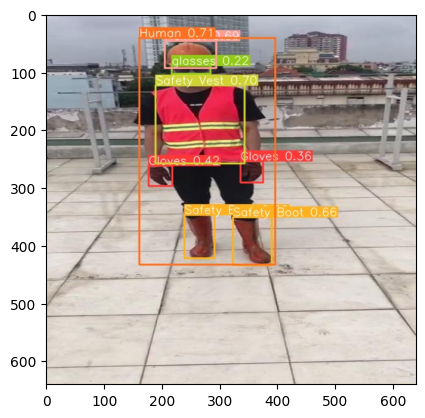

In [ ]:
display_image('/content/drive/MyDrive/Construction-PPE-3/runs/detect/predict/Video4_281_jpg.rf.8417039db44dc7bf13753fbd973231bd.jpg')

Type:  <class 'PIL.JpegImagePlugin.JpegImageFile'> 

Shape:  (667, 1000, 3) 



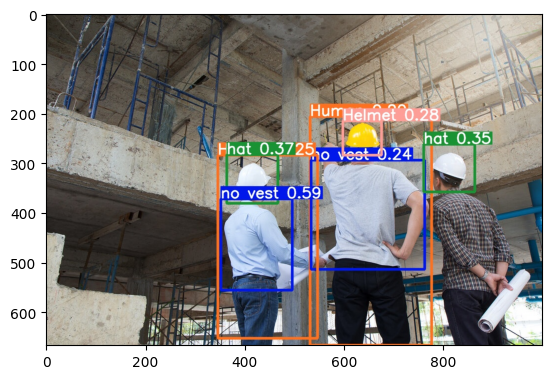

In [ ]:
display_image('runs/detect/predict/An+engineer+elaborating+building+issues+with+others.jpeg')

Type:  <class 'PIL.WebPImagePlugin.WebPImageFile'> 

Shape:  (470, 940, 3) 



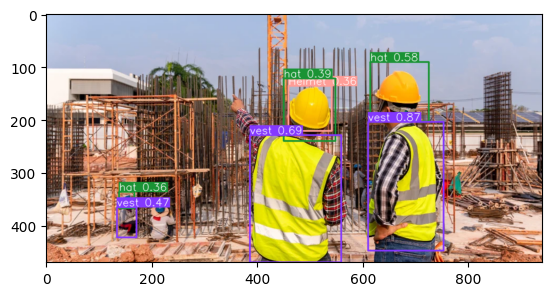

In [ ]:
display_image('runs/detect/predict/Construction civil engineer technician and architect working.png.webp')

Type:  <class 'PIL.WebPImagePlugin.WebPImageFile'> 

Shape:  (469, 939, 3) 



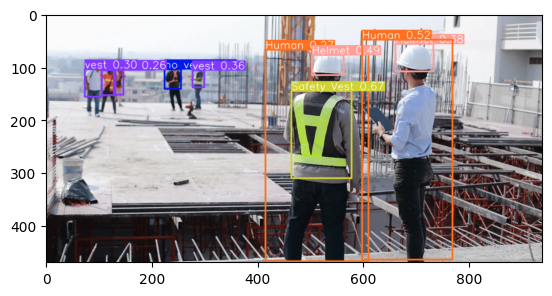

In [ ]:
display_image('runs/detect/predict/Structual Engineering - Featured Image - PES.png.webp')

**A Video Test Example**

In [5]:
import warnings
warnings.filterwarnings("ignore")

import os
import re
import glob
import yaml
import subprocess

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_palette('Set3')

import IPython.display as display
from IPython.display import Video

from PIL import Image
import cv2

import torch

from ultralytics import YOLO

def perform_inference_on_video(video_path, output_path):
    # Load the YOLOv9 model
    model = YOLO('/content/drive/MyDrive/Construction-PPE-3/runs/detect/yolov5s_ppe_css_18_epochs/weights/best.pt')

    # Open the video file
    cap = cv2.VideoCapture(video_path)

    # Get video properties
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    # Loop through each frame in the video
    while cap.isOpened():
        ret, frame = cap.read()

        if not ret:
            break

        # Perform inference on the frame
        results = model(frame)

        # Write the frame to the output video
        out.write(frame)

    # Release the video capture and writer objects
    cap.release()
    out.release()
    cv2.destroyAllWindows()

In [6]:
import warnings
warnings.filterwarnings("ignore")

import os
import re
import glob
import yaml
import subprocess

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_palette('Set3')

import IPython.display as display
from IPython.display import Video

from PIL import Image
import cv2

import torch

from ultralytics import YOLO

class CFG:
    ### inference: use any pretrained or custom model
    # WEIGHTS = 'yolov8x.pt' # yolov8n.pt, yolov8s.pt, yolov8m.pt, yolov8l.pt, yolov8x.pt
    WEIGHTS = '/content/drive/MyDrive/Construction-PPE-3/runs/detect/yolov5s_ppe_css_18_epochs/weights/best.pt'

    CONFIDENCE = 0.55 # 0.35
    CONFIDENCE_INT = int( round(CONFIDENCE * 100, 0) )

    CLASSES_TO_DETECT = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15] # Hardhat, NO-Hardhat, NO-Safety Vest, Person, Safety Vest

    VERTICES_POLYGON = np.array([[200,720], [0,700], [500,620], [990,690], [820,720]])

    EXP_NAME = 'ppe'

    ### just some video examples
    VID_001 = '/content/drive/MyDrive/Construction-PPE-3/data/test.mp4'

    ### choose filepath to make inference on (image or video)
    PATH_TO_INFER_ON = VID_001
    EXT = PATH_TO_INFER_ON.split('.')[-1] # get file extension
    FILENAME_TO_INFER_ON = PATH_TO_INFER_ON.split('/')[-1].split('.')[0] # get filename

    ### paths
    ROOT_DIR = './'
    OUTPUT_DIR = './'

In [7]:
def get_video_properties(video_path):
    # Open the video file
    cap = cv2.VideoCapture(video_path)

    # Check if the video file is opened successfully
    if not cap.isOpened():
        raise ValueError("Could not open video file")

    # Get video properties
    properties = {
        "fps": int(cap.get(cv2.CAP_PROP_FPS)),
        "frame_count": int(cap.get(cv2.CAP_PROP_FRAME_COUNT)),
        "duration_seconds": int( cap.get(cv2.CAP_PROP_FRAME_COUNT) / cap.get(cv2.CAP_PROP_FPS) ),
        "width": int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),
        "height": int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)),
        "codec": int(cap.get(cv2.CAP_PROP_FOURCC)),
    }

    # Release the video capture object
    cap.release()

    return properties

In [8]:
### testing function
video_properties = get_video_properties('/content/drive/MyDrive/Construction-PPE-3/data/test.mp4')
video_properties

{'fps': 29,
 'frame_count': 585,
 'duration_seconds': 19,
 'width': 1280,
 'height': 720,
 'codec': 875967080}

In [39]:
import warnings
warnings.filterwarnings("ignore")

import os
import re
import glob
import yaml
import subprocess

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_palette('Set3')

import IPython.display as display
from IPython.display import Video

from PIL import Image
import cv2

import torch

from ultralytics import YOLO
OUT_VIDEO_NAME = CFG.PATH_TO_INFER_ON
subprocess.run(
    [
        "ffmpeg",  "-i", CFG.PATH_TO_INFER_ON, "-crf",
        "18", "-preset", "veryfast", "-hide_banner", "-loglevel",
        "error", "-vcodec", "libx264", OUT_VIDEO_NAME,
    ]
)

Video(data=OUT_VIDEO_NAME, embed=True, height=int(video_properties['height'] * 0.5), width=int(video_properties['width'] * 0.5))

In [40]:
def get_image_properties(image):
    if isinstance(image, str):
        # If image is a file path, read the image
        img = cv2.imread(image)
        if img is None:
            raise ValueError("Could not read image file")
    elif isinstance(image, np.ndarray):
        # If image is already a NumPy array, use it directly
        img = image
    else:
        raise ValueError("Input must be a file path or a NumPy array")

    # Get image properties
    properties = {
        "width": img.shape[1],
        "height": img.shape[0],
        "channels": img.shape[2] if len(img.shape) == 3 else 1,
        "dtype": img.dtype,
    }

    return properties

In [41]:
print('File path to make inference on: ', CFG.PATH_TO_INFER_ON)
print('File name to make inference on: ', CFG.FILENAME_TO_INFER_ON)

File path to make inference on:  /content/drive/MyDrive/Construction-PPE-3/data/test.mp4
File name to make inference on:  test


In [9]:
def display_image(image, print_info = True, hide_axis = False):
    if isinstance(image, str):  # Check if it's a file path
        img = Image.open(image)
        plt.imshow(img)
    elif isinstance(image, np.ndarray):  # Check if it's a NumPy array
        image = image[..., ::-1]  # BGR to RGB
        img = Image.fromarray(image)
        plt.imshow(img);
    else:
        raise ValueError("Unsupported image format")

    if print_info:
        print('Type: ', type(img), '\n')
        print('Shape: ', np.array(img).shape, '\n')

    if hide_axis:
        plt.axis('off')

    plt.show()

In [10]:
cap = cv2.VideoCapture(CFG.PATH_TO_INFER_ON)

if not cap.isOpened():
    print("Error: Could not open video file.")
else:
    # Read the first frame
    ret, frame_test = cap.read()
    cap.release()

vertices_polygon = np.array([[200,720], [0,700], [500,620], [990,690], [820,720]]) # manually adjusted

cv2.polylines(frame_test, [vertices_polygon.reshape(-1, 1, 2)], True, (0, 0, 128), 4)

mod = frame_test.copy()
overlay = cv2.fillPoly(mod, pts = [vertices_polygon], color=(0, 0, 128))
background = frame_test.copy()

frame_test = cv2.addWeighted(
    src1 = background, # fisrt image
    alpha = 0.6, # first image weight
    src2 = overlay, # second image
    beta = 0.4, # second image weight
    gamma = 0.1, # scalar factor
    dst = overlay # output array shape
)

Type:  <class 'PIL.Image.Image'> 

Shape:  (720, 1280, 3) 



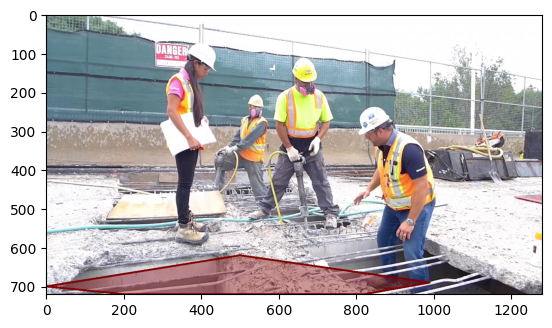

In [44]:
display_image(frame_test)

In [12]:
model = YOLO(CFG.WEIGHTS)

In [13]:
model.names

{0: 'Gloves',
 1: 'Helmet',
 2: 'Human',
 3: 'Safety Boot',
 4: 'Safety Vest',
 5: 'boots',
 6: 'glasses',
 7: 'gloves',
 8: 'hat',
 9: 'helmet',
 10: 'no boot',
 11: 'no boots',
 12: 'no gloves',
 13: 'no hat',
 14: 'no vest',
 15: 'vest'}

In [14]:
%%time
results = model.predict(
    source = '/content/drive/MyDrive/Construction-PPE-3/data/test.mp4',
    save = True,
    classes = CFG.CLASSES_TO_DETECT,
    conf = 0.30,
    save_txt = True,
    save_conf = True,
    show = True,
    device = 'cpu',
    project = '/content/drive/MyDrive/Construction-PPE-3/runs/detect/',
)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/585) /content/drive/MyDrive/Construction-PPE-3/data/test.mp4: 256x416 3 Helmets, 4 Humans, 1 Safety Boot, 2 Safety Vests, 3 helmets, 378.9ms
video 1/1 (frame 2/585) /content/drive/MyDrive/Construction-PPE-3/data/test.mp4: 256x416 3 Helmets, 4 Humans, 1 Safety Boot, 2 Safety Vests, 2 helmets, 1 vest, 289.9ms
video 1/1 (frame 3/585) /content/drive/MyDrive/Constru

# Loss

- The loss function in YOLO consists of three main components: box loss, class loss (cls loss), and objectness loss (dfl loss).
- The total loss in YOLO is a combination of these three components

___

**Box loss:**
- The box loss measures how accurately the predicted bounding box coordinates match the ground truth bounding box.
- Is typically computed using a regression loss, such as Mean Squared Error (MSE), between the predicted bounding box coordinates (center coordinates, width, and height) and the ground truth bounding box coordinates.

___

**Class loss (cls):**
- The class loss measures how well the predicted class probabilities match the true class labels.
- The class loss is usually computed using a categorical cross-entropy loss, which penalizes the difference between the predicted class probabilities and the true class labels.

___

**Objectness loss (dfl):**
- Distribution Focal Loss
- YOLO predicts an "objectness" score for each bounding box, indicating the presence of an object within the grid cell. This score helps filter out irrelevant bounding boxes.
- The objectness loss is calculated based on the difference between the predicted objectness score and the ground truth objectness label. It penalizes the model for false positives and false negatives in predicting the presence of an object.

In [15]:
df = pd.read_csv(f'runs/detect/yolov5s_ppe_css_18_epochs/results.csv')
df = df.rename(columns=lambda x: x.replace(" ", ""))
df.to_csv(f'runs/detect/yolov5s_ppe_css_18_epochs/training_log_df.csv', index=False)
df

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,1.29510,1.66490,1.28590,0.31492,0.56365,0.31497,0.19978,1.26950,1.5429,1.2382,0.000166,0.000166,0.000166
1,2,1.14410,1.18880,1.18040,0.31601,0.62178,0.33613,0.22011,1.18180,1.3830,1.1862,0.000315,0.000315,0.000315
2,3,1.09870,1.11390,1.15670,0.32796,0.63410,0.36175,0.23171,1.16470,1.3276,1.1670,0.000445,0.000445,0.000445
3,4,1.07030,1.06890,1.14060,0.33656,0.66084,0.35203,0.22848,1.14710,1.2848,1.1608,0.000418,0.000418,0.000418
4,5,1.02690,1.01640,1.12020,0.32887,0.70507,0.37920,0.24676,1.11000,1.2503,1.1408,0.000390,0.000390,0.000390
5,6,1.00150,0.97265,1.10700,0.35193,0.69095,0.38482,0.24745,1.09580,1.2374,1.1332,0.000362,0.000362,0.000362
6,7,0.97665,0.95621,1.09640,0.39648,0.72107,0.40596,0.26157,1.06270,1.1657,1.1117,0.000335,0.000335,0.000335
7,8,0.94983,0.90073,1.07760,0.36959,0.71658,0.39524,0.25977,1.06400,1.1724,1.1051,0.000307,0.000307,0.000307
8,9,0.93604,0.85268,1.07160,0.43560,0.73317,0.40292,0.25644,1.05740,1.1748,1.0918,0.000280,0.000280,0.000280
9,10,0.90398,0.81671,1.05270,0.45936,0.74246,0.41424,0.26929,1.02330,1.1378,1.0849,0.000253,0.000253,0.000253


In [16]:
print('*'*50)
print('\nBest Training Box loss: ', df['train/box_loss'].min(), ', on epoch: ', df['train/box_loss'].argmin() + 1, '\n')
print('\nBest Validation Box loss: ', df['val/box_loss'].min(), ', on epoch: ', df['val/box_loss'].argmin() + 1, '\n')

print('='*50)
print('\nBest Training Cls loss: ', df['train/cls_loss'].min(), ', on epoch: ', df['train/cls_loss'].argmin() + 1, '\n')
print('\nBest Validation Cls loss: ', df['val/cls_loss'].min(), ', on epoch: ', df['val/cls_loss'].argmin() + 1, '\n')

print('='*50)
print('\nBest Training DFL loss: ', df['train/dfl_loss'].min(), ', on epoch: ', df['train/dfl_loss'].argmin() + 1, '\n')
print('\nBest Validation DFL loss: ', df['val/dfl_loss'].min(), ', on epoch: ', df['val/dfl_loss'].argmin() + 1, '\n')

**************************************************

Best Training Box loss:  0.75147 , on epoch:  18 


Best Validation Box loss:  0.94003 , on epoch:  18 


Best Training Cls loss:  0.66646 , on epoch:  18 


Best Validation Cls loss:  1.0814 , on epoch:  16 


Best Training DFL loss:  0.97628 , on epoch:  18 


Best Validation DFL loss:  1.0329 , on epoch:  18 



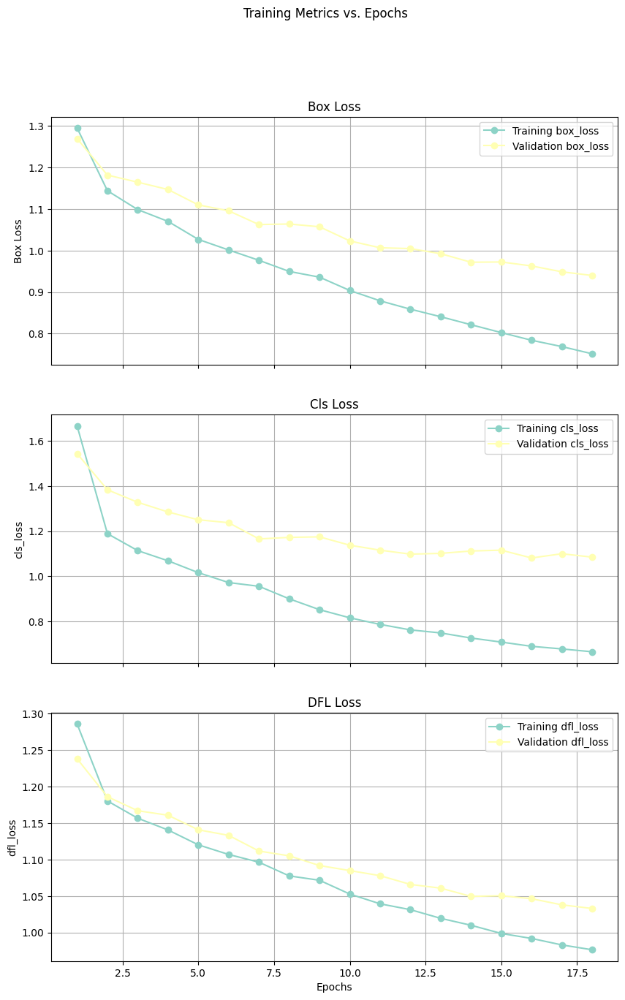

In [17]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 15), sharex=True)

### Training and Validation box_loss
ax1.set_title('Box Loss')
ax1.plot(df['epoch'], df['train/box_loss'], label='Training box_loss', marker='o', linestyle='-')
ax1.plot(df['epoch'], df['val/box_loss'], label='Validation box_loss', marker='o', linestyle='-')
ax1.set_ylabel('Box Loss')
ax1.legend()
ax1.grid(True)

### Training and Validation cls_loss
ax2.set_title('Cls Loss')
ax2.plot(df['epoch'], df['train/cls_loss'], label='Training cls_loss', marker='o', linestyle='-')
ax2.plot(df['epoch'], df['val/cls_loss'], label='Validation cls_loss', marker='o', linestyle='-')
ax2.set_ylabel('cls_loss')
ax2.legend()
ax2.grid(True)

### Training and Validation dfl_loss
ax3.set_title('DFL Loss')
ax3.plot(df['epoch'], df['train/dfl_loss'], label='Training dfl_loss', marker='o', linestyle='-')
ax3.plot(df['epoch'], df['val/dfl_loss'], label='Validation dfl_loss', marker='o', linestyle='-')
ax3.set_xlabel('Epochs')
ax3.set_ylabel('dfl_loss')
ax3.legend()
ax3.grid(True)

plt.suptitle('Training Metrics vs. Epochs')
plt.show()

# Validation results

# Conclusions

- In conclusion, our project showcases the robust capabilities of YOLOv5 and YOLOv9 in PPE detection, emphasizing their potential to enhance workplace safety through accurate and efficient identification of protective gear.

- **<font color='orange'>By Nouha and Douha !</font>**